## Sim Demo

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

  import numpy.matlib as npm

  autumn = cm.get_cmap('autumn', 256)

  winter = cm.get_cmap('winter_r', 256)



In [3]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run) 

<module 'sim.sim_run' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim_run.py'>

#### Check job specs

In [4]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 5.2%
RAM Usage: 3.8%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [5]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


0
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.00 GB


In [6]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  1% |


In [7]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

## Simulation tests <a id="sims"></a>

### Model Parameter Counts

#### **Linear Models**
- **PCA Bilinear:** 730  _(27 PCs)_
- **PLS Bilinear:** 101  _(10 PLS components)_
- **Bilinear Low-rank:** 73,800  _(rank 10)_
- **PLS MLP:** 158,993  _(10 PLS components, including PLS projection matrices)_
- **PCA MLP:** 47,873  _(27 PCs, 2-layer)_

---

#### **MLP and SMT Models**

#### 2-Layer Models
- **MLP:** 3,812,609
- **SMT:** 1,399,947
- **MLP w/ CLS:** 3,814,145
- **SMT w/ CLS:** 1,405,579

#### 3-Layer Models
- **MLP:** 7,723,777
- **SMT:** 2,162,315
- **MLP w/ CLS:** 7,726,849
- **SMT w/ CLS:** 2,173,067

---

### Coord MLP Parameter Counts
- **[32]:** 321
- **[64, 32]:** 2,753
- **[128, 64]:** 9,601
- **[256, 128]:** 35,685
- **[512, 256, 128]:** 169,729

In [8]:
from data.data_load import load_connectome

In [9]:
# Test loading FC connectomes for different datasets and parcellations
standard_parcs = ['S100', 'S156', 'S456']
ipa_parcs = ['iPA_183', 'iPA_391', 'iPA_729']

print("Testing standard parcellation FC connectome loading:")
print("-" * 50)

# Test standard parcellations for HCP and UKBB
for parc in standard_parcs:
    for dataset in ['UKBB', 'HCP']:
        try:
            matrix = load_connectome(parcellation=parc, dataset=dataset, measure='FC')
            print(f"Successfully loaded {dataset} {parc} FC matrix with shape {matrix.shape}")
        except Exception as e:
            print(f"Failed loading {dataset} {parc} FC matrix: {str(e)}")
    print("-" * 50)

print("\nTesting BHA2 iPA FC connectome loading:")
print("-" * 50)

# Test iPA parcellations for BHA2
for parc in ipa_parcs:
    try:
        matrix = load_connectome(parcellation=parc, dataset='BHA2', measure='FC')
        print(f"Successfully loaded BHA2 {parc} FC matrix with shape {matrix.shape}")
    except Exception as e:
        print(f"Failed loading BHA2 {parc} FC matrix: {str(e)}")
    print("-" * 50)


Testing standard parcellation FC connectome loading:
--------------------------------------------------
Failed loading UKBB S100 FC matrix: UKBB only supports S156/S456 parcellation
Successfully loaded HCP S100 FC matrix with shape (114, 114)
--------------------------------------------------
Successfully loaded UKBB S156 FC matrix with shape (156, 156)
Failed loading HCP S156 FC matrix: /scratch/asr655/neuroinformatics/GeneEx2Conn_data/HCP1200_fMRI/HCP1200_S156_FC_mu.csv not found.
--------------------------------------------------
Successfully loaded UKBB S456 FC matrix with shape (456, 456)
Successfully loaded HCP S456 FC matrix with shape (456, 456)
--------------------------------------------------

Testing BHA2 iPA FC connectome loading:
--------------------------------------------------
Successfully loaded BHA2 iPA_183 FC matrix with shape (183, 183)
--------------------------------------------------
Successfully loaded BHA2 iPA_391 FC matrix with shape (391, 391)
--------------

In [10]:
# Test loading SC connectomes for different datasets and parcellations
standard_parcs = ['S100', 'S156', 'S456']
ipa_parcs = ['iPA_183', 'iPA_391', 'iPA_729']

print("Testing standard parcellation SC connectome loading:")
print("-" * 50)

# Test standard parcellations for HCP and UKBB
for parc in standard_parcs:
    for dataset in ['UKBB', 'HCP']:
        try:
            matrix = load_connectome(parcellation=parc, dataset=dataset, measure='SC')
            print(f"Successfully loaded {dataset} {parc} SC matrix with shape {matrix.shape}")
        except Exception as e:
            print(f"Failed loading {dataset} {parc} SC matrix: {str(e)}")
    print("-" * 50)

print("\nTesting BHA2 iPA SC connectome loading:")
print("-" * 50)

# Test iPA parcellations for BHA2
for parc in ipa_parcs:
    try:
        matrix = load_connectome(parcellation=parc, dataset='BHA2', measure='SC')
        print(f"Successfully loaded BHA2 {parc} SC matrix with shape {matrix.shape}")
    except Exception as e:
        print(f"Failed loading BHA2 {parc} SC matrix: {str(e)}")
    print("-" * 50)


Testing standard parcellation SC connectome loading:
--------------------------------------------------
Failed loading UKBB S100 SC matrix: UKBB only supports S156/S456 parcellation
Successfully loaded HCP S100 SC matrix with shape (114, 114)
--------------------------------------------------
Failed loading UKBB S156 SC matrix: [Errno 2] No such file or directory: './data/HCP1200/4S156_DTI_count.mat'
Failed loading HCP S156 SC matrix: [Errno 2] No such file or directory: './data/HCP1200/4S156_DTI_count.mat'
--------------------------------------------------
Successfully loaded UKBB S456 SC matrix with shape (456, 456)
Successfully loaded HCP S456 SC matrix with shape (456, 456)
--------------------------------------------------

Testing BHA2 iPA SC connectome loading:
--------------------------------------------------
Successfully loaded BHA2 iPA_183 SC matrix with shape (183, 183)
--------------------------------------------------
Successfully loaded BHA2 iPA_391 SC matrix with shape 

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 11988, Number of 0s: 195948, Class balance (1s): 0.058
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
Network coverage: 100.0% of regions
Network sizes: [113, 113, 113, 116]
feature_name: transcriptome, processing_type: None
features ['transcriptome']
Feature matrix, X, generated... expanding to pairwise dataset


  return LooseVersion(v) >= LooseVersion(check)

ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: asratzan (alexander-ratzan-new-york-university). Use `wandb login --relogin` to force relogin
wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: vcc6mifk
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/vcc6mifk
Initialized sweep with ID: vcc6mifk
2
3
4


wandb: Agent Starting Run: r341wdkr with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 30
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 1
ERROR: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import display



  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 443701


  warnings.warn(



Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.00691
fold0_val_loss,0.02727


wandb: Agent Starting Run: 3xsdqfik with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 12
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()

  warnings.warn(



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 177265
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.01894
fold0_val_loss,0.02535


wandb: Agent Starting Run: cebstdco with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 25
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()

  warnings.warn(



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 369626
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.00871
fold0_val_loss,0.03584


wandb: Sorting runs by +summary_metrics.mean_val_loss


BEST CONFIG {'scale': True, 'epochs': 100, 'binarize': False, 'max_iter': 1000, 'input_dim': 14760, 'batch_size': 512, 'n_components': 12, 'weight_decay': 0.001, 'learning_rate': 0.003, 'optimize_encoder': False}
X_train shape: torch.Size([342, 7380])
Y_train shape: torch.Size([342, 342])


  warnings.warn(

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Total number of parameters: 177265


  self.comm = Comm(**args)

  from IPython.core.display import HTML, display  # type: ignore



Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 342 regions, 116622 connections


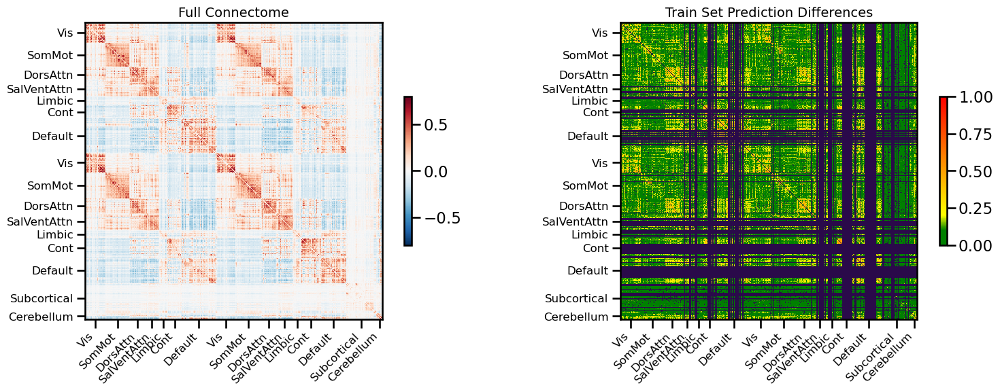

<Figure size 640x480 with 0 Axes>

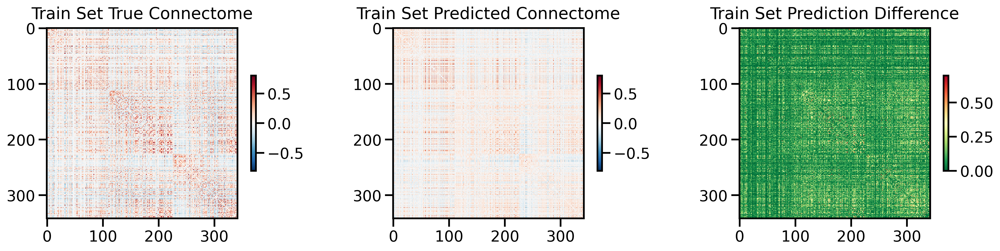

  return iter(self.unbind(0))



<Figure size 640x480 with 0 Axes>

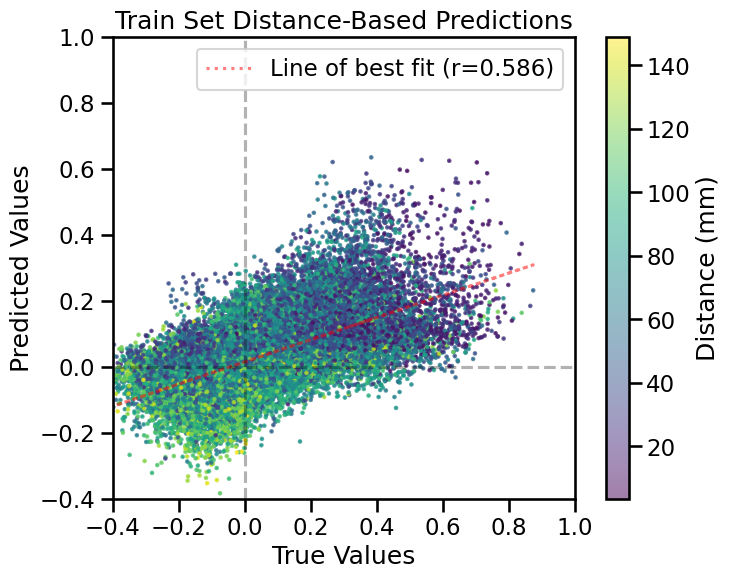

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 113 regions, 12656 connections


<Figure size 640x480 with 0 Axes>

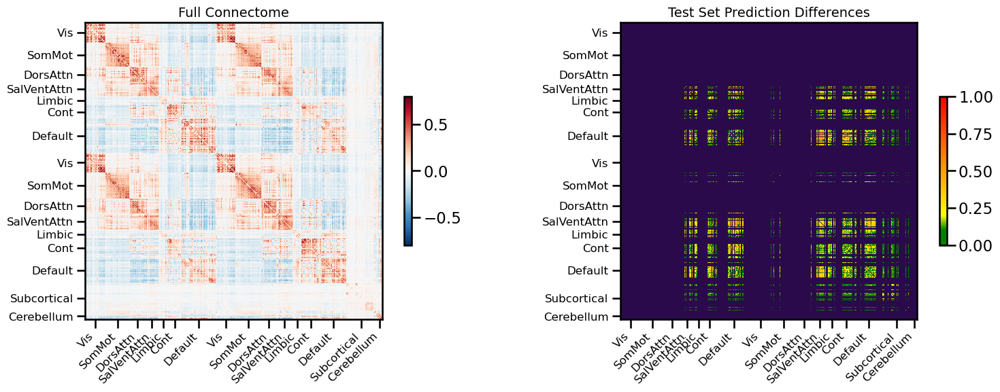

<Figure size 640x480 with 0 Axes>

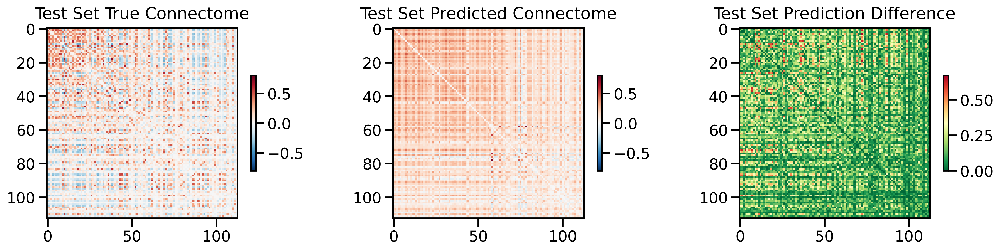

<Figure size 640x480 with 0 Axes>

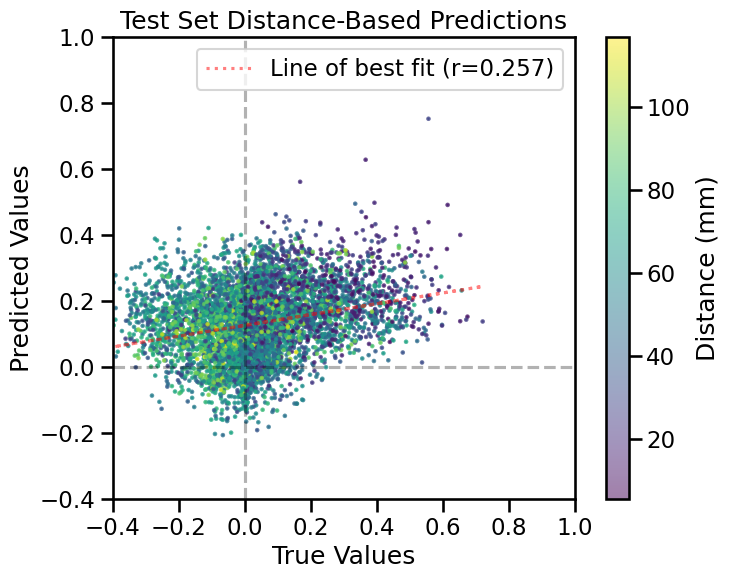

TRAIN METRICS
GLOBAL: mse=0.017535, mae=0.095450, r2=0.3438, pearson_r=0.5865, spearman_r=0.5742, geodesic_distance=28.1259
DISTANCE-BASED: short=0.6273, mid=0.5239, long=0.4437
HEMISPHERIC: left=0.5560, right=0.6131, inter=0.5953
CONNECTION STRENGTH: neg=0.0252, weak=0.5239, pos=0.1192
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.3412    0.4208
  Default       0.5174    0.3596
  SalVentAttn    0.4096    0.4810
  Limbic        0.5368    0.4471
  DorsAttn      0.2795    0.4731
  SomMot        0.4241    0.5624
  Vis           0.4756    0.4075
  Subcortical    0.6365    0.3972
  Cerebellum    0.4229    0.3337

TEST METRICS
GLOBAL: mse=0.038669, mae=0.153056, r2=-0.3770, pearson_r=0.2575, spearman_r=0.2607, geodesic_distance=13.1599
DISTANCE-BASED: short=0.2629, mid=0.1819
HEMISPHERIC: left=0.2255, right=0.3319, inter=0.2135
CONNECTION STRENGTH: neg=-0.0345, weak=0.1880, pos=0.0694
NETWORK CORRELATIONS:
  NETWORK      INTRA      I

  from IPython.core.display import HTML, display  # type: ignore



best_val_loss,▁
test_mse_loss,▁
train_mse_loss,▁
best_val_loss,0.02535
test_mse_loss,0.03867
train_mse_loss,0.01754


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: 4g1a72vz
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/4g1a72vz
Initialized sweep with ID: 4g1a72vz
1
3
4


wandb: Agent Starting Run: cuysgvsr with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 8
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  warnings.warn(



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 118145
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.02323
fold0_val_loss,0.03367


wandb: Agent Starting Run: fyjlsc4e with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 5
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



  gc.collect()

  warnings.warn(



Processing inner fold 0
X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 73826
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.02785
fold0_val_loss,0.02929


wandb: Agent Starting Run: 5gvexo55 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 30
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])


  warnings.warn(



Total number of parameters: 443701
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.00687
fold0_val_loss,0.03991


wandb: Sorting runs by +summary_metrics.mean_val_loss
  warnings.warn(

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'scale': True, 'epochs': 100, 'binarize': False, 'max_iter': 1000, 'input_dim': 14760, 'batch_size': 512, 'n_components': 5, 'weight_decay': 1, 'learning_rate': 0.003, 'optimize_encoder': False}
X_train shape: torch.Size([342, 7380])
Y_train shape: torch.Size([342, 342])
Total number of parameters: 73826


  self.comm = Comm(**args)

  from IPython.core.display import HTML, display  # type: ignore



Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 342 regions, 116622 connections


<Figure size 640x480 with 0 Axes>

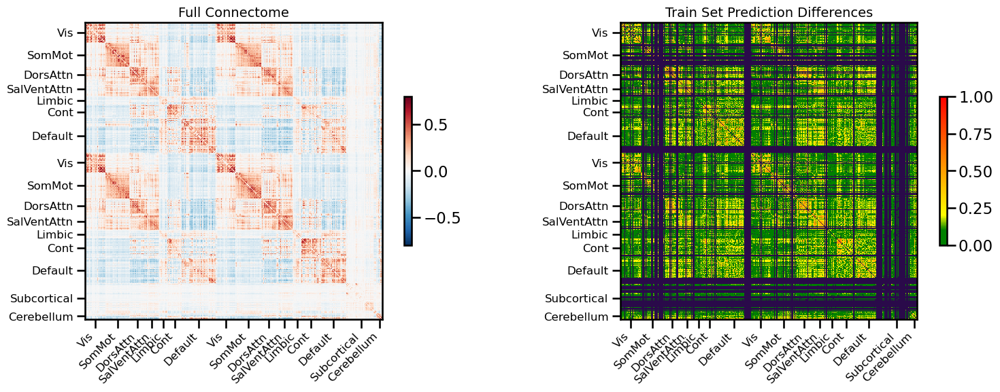

<Figure size 640x480 with 0 Axes>

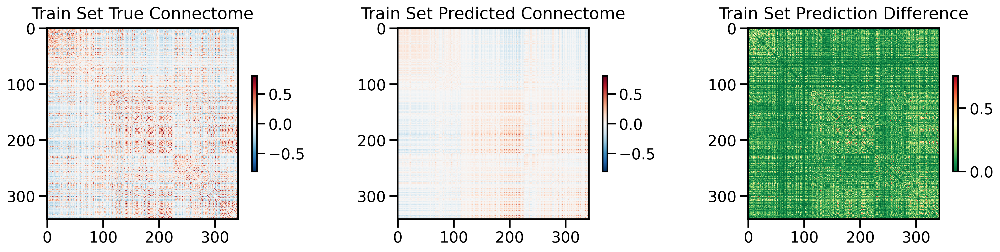

  return iter(self.unbind(0))

  return iter(self.unbind(0))



<Figure size 640x480 with 0 Axes>

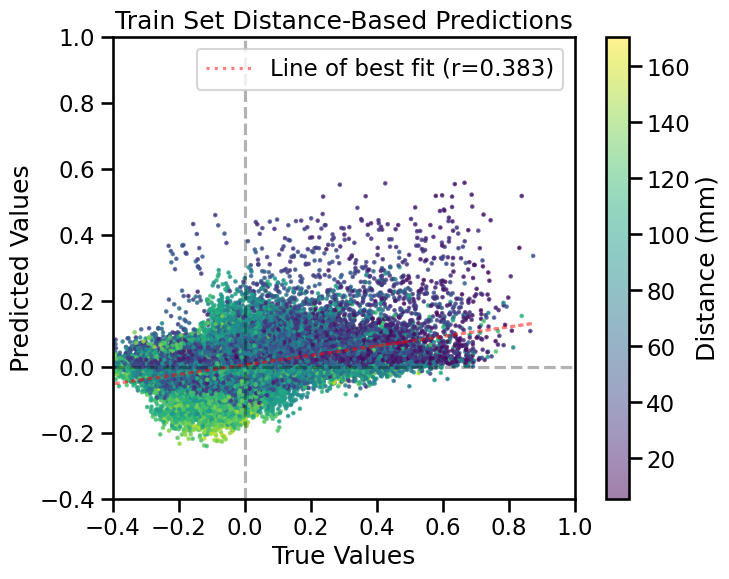

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 113 regions, 12656 connections


<Figure size 640x480 with 0 Axes>

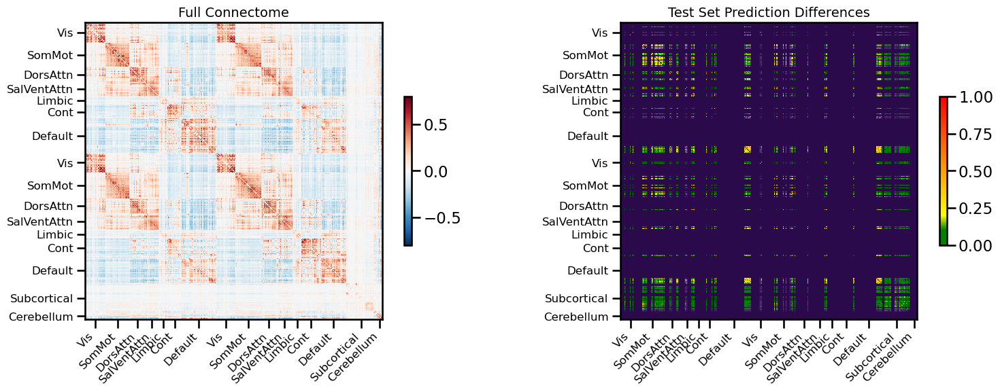

<Figure size 640x480 with 0 Axes>

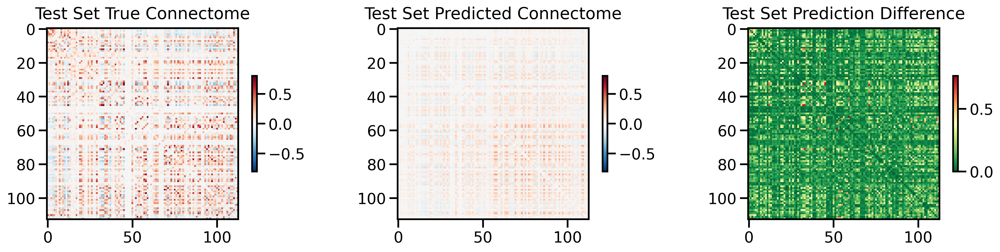

<Figure size 640x480 with 0 Axes>

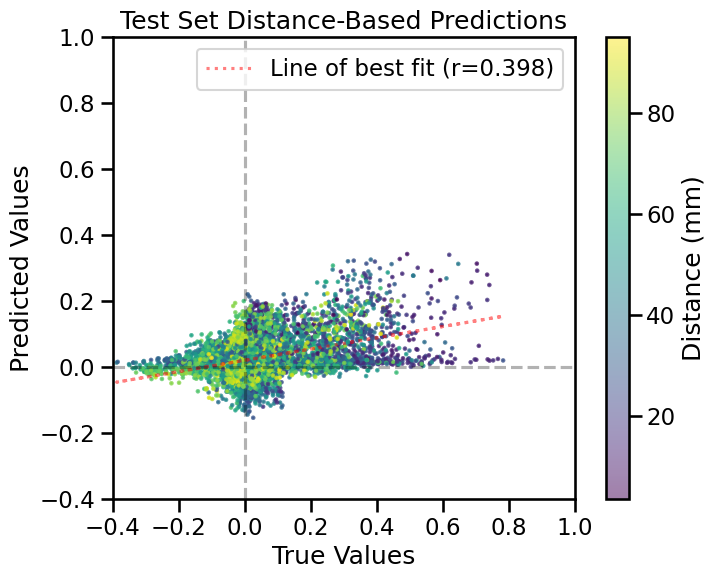

TRAIN METRICS
GLOBAL: mse=0.024206, mae=0.114690, r2=0.1466, pearson_r=0.3830, spearman_r=0.3889, geodesic_distance=44.2146
DISTANCE-BASED: short=0.3952, mid=0.2812, long=0.2784
HEMISPHERIC: left=0.3923, right=0.3942, inter=0.3743
CONNECTION STRENGTH: neg=-0.0848, weak=0.3281, pos=0.2720
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.0619    0.2222
  Default       0.2954    0.2501
  SalVentAttn    0.1866    0.0847
  Limbic        0.4539    0.3325
  DorsAttn      0.1652    0.3401
  SomMot        0.3430    0.3256
  Vis           0.1388    0.3786
  Subcortical    0.2669    0.1861
  Cerebellum   -0.1863    0.0396

TEST METRICS
GLOBAL: mse=0.020085, mae=0.103241, r2=0.1379, pearson_r=0.3980, spearman_r=0.3153, geodesic_distance=24.1000
DISTANCE-BASED: short=0.4014, mid=0.3796
HEMISPHERIC: left=0.4415, right=0.3192, inter=0.3808
CONNECTION STRENGTH: weak=0.2814, pos=0.0711
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------

  from IPython.core.display import HTML, display  # type: ignore



best_val_loss,▁
test_mse_loss,▁
train_mse_loss,▁
best_val_loss,0.02929
test_mse_loss,0.02009
train_mse_loss,0.02421


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: 5u3u8grv
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/5u3u8grv
Initialized sweep with ID: 5u3u8grv
1
2
4


wandb: Agent Starting Run: adqfqmo1 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 15
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  warnings.warn(



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])
Total number of parameters: 221626
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.01146
fold0_val_loss,0.03166


wandb: Agent Starting Run: bxvare59 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 30
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])


  warnings.warn(



Total number of parameters: 443701
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.00534
fold0_val_loss,0.03398


wandb: Agent Starting Run: fz8gl808 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 30
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  gc.collect()



X_train shape: torch.Size([229, 7380])
Y_train shape: torch.Size([229, 229])


  warnings.warn(



Total number of parameters: 443701
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.00532
fold0_val_loss,0.03435


wandb: Sorting runs by +summary_metrics.mean_val_loss
  warnings.warn(

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'scale': True, 'epochs': 100, 'binarize': False, 'max_iter': 1000, 'input_dim': 14760, 'batch_size': 512, 'n_components': 15, 'weight_decay': 1, 'learning_rate': 0.003, 'optimize_encoder': False}
X_train shape: torch.Size([342, 7380])
Y_train shape: torch.Size([342, 342])
Total number of parameters: 221626


  self.comm = Comm(**args)

  from IPython.core.display import HTML, display  # type: ignore



Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 342 regions, 116622 connections


<Figure size 640x480 with 0 Axes>

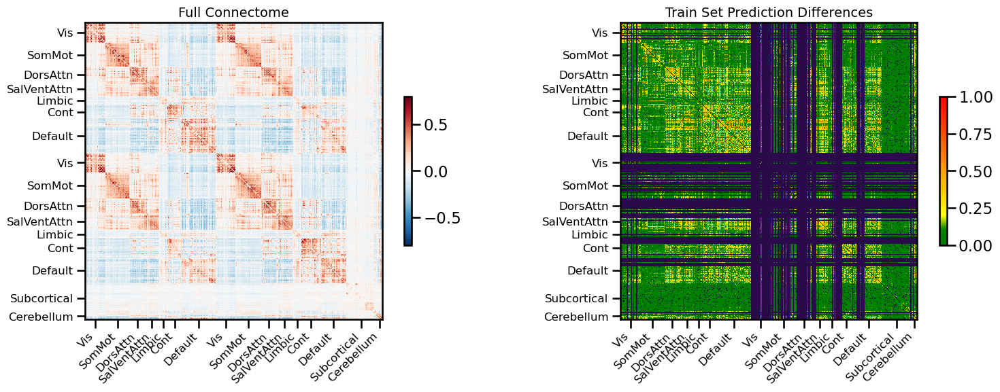

<Figure size 640x480 with 0 Axes>

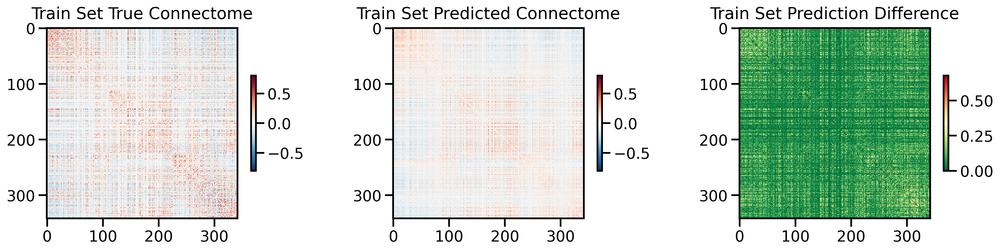

  return iter(self.unbind(0))

  return iter(self.unbind(0))



<Figure size 640x480 with 0 Axes>

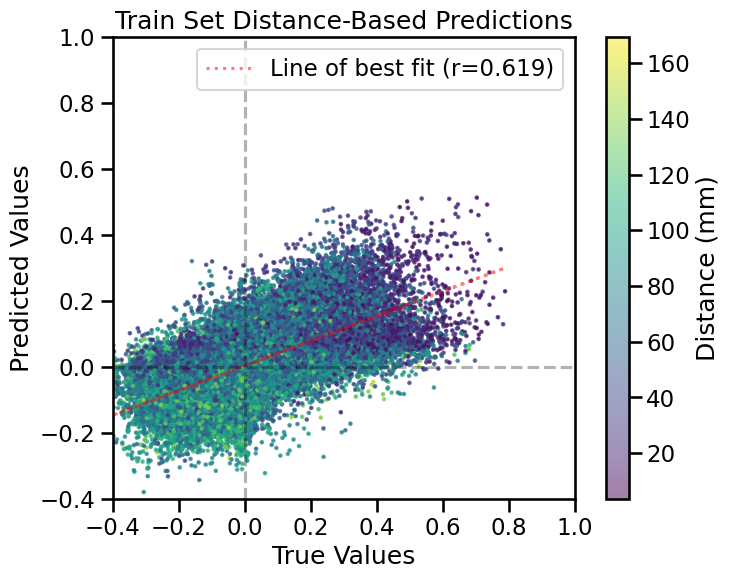

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 113 regions, 12656 connections


<Figure size 640x480 with 0 Axes>

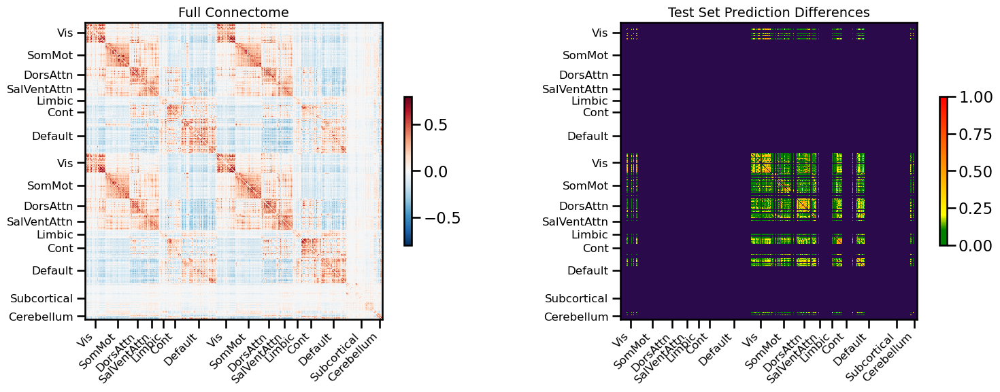

<Figure size 640x480 with 0 Axes>

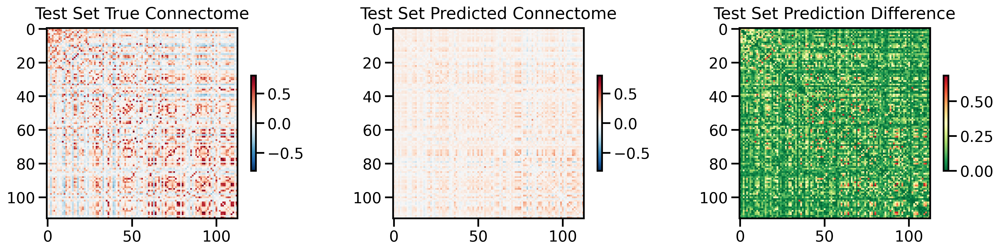

<Figure size 640x480 with 0 Axes>

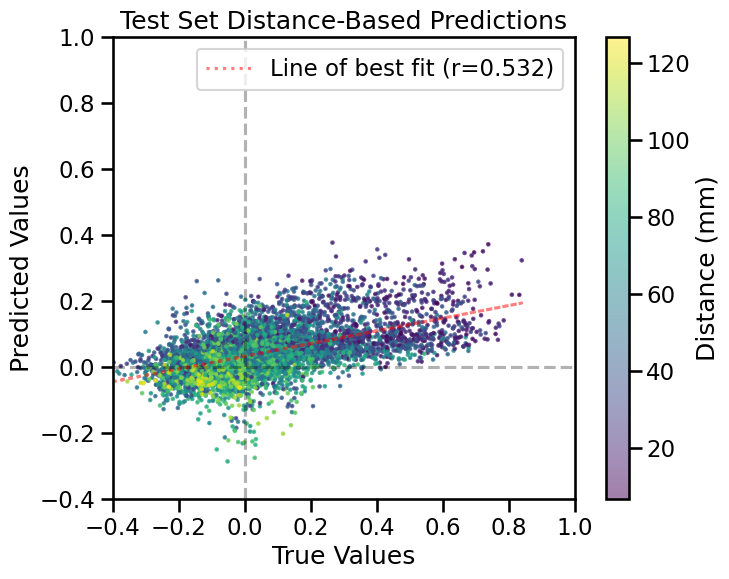

TRAIN METRICS
GLOBAL: mse=0.014216, mae=0.084630, r2=0.3833, pearson_r=0.6193, spearman_r=0.6249, geodesic_distance=27.4580
DISTANCE-BASED: short=0.6428, mid=0.5666, long=0.5496
HEMISPHERIC: left=0.6014, right=0.6758, inter=0.6270
CONNECTION STRENGTH: neg=-0.0929, weak=0.5795, pos=0.1063
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.3450    0.4473
  Default       0.5359    0.5003
  SalVentAttn    0.2799    0.6005
  Limbic        0.5223    0.5101
  DorsAttn      0.1405    0.6494
  SomMot        0.4578    0.6630
  Vis           0.4588    0.4754
  Subcortical    0.5893    0.3764
  Cerebellum    0.4979    0.5162

TEST METRICS
GLOBAL: mse=0.029313, mae=0.126341, r2=0.2462, pearson_r=0.5325, spearman_r=0.5336, geodesic_distance=18.3222
DISTANCE-BASED: short=0.5383, mid=0.3672
HEMISPHERIC: left=0.8087, right=0.5148, inter=0.6112
CONNECTION STRENGTH: weak=0.4200, pos=0.2440
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------

  from IPython.core.display import HTML, display  # type: ignore



best_val_loss,▁
test_mse_loss,▁
train_mse_loss,▁
best_val_loss,0.03166
test_mse_loss,0.02931
train_mse_loss,0.01422


Final evaluation metrics logged successfully.


wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('best_parameters' was unexpected)


Create sweep with ID: xnvfuvt7
Sweep URL: https://wandb.ai/alexander-ratzan-new-york-university/gx2conn/sweeps/xnvfuvt7
Initialized sweep with ID: xnvfuvt7
1
2
3


wandb: Agent Starting Run: g5dsk0fn with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 8
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



Processing inner fold 0


  warnings.warn(



X_train shape: torch.Size([226, 7380])
Y_train shape: torch.Size([226, 226])
Total number of parameters: 118145
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.01901
fold0_val_loss,0.02768


wandb: Agent Starting Run: omyw17r7 with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 5
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



  gc.collect()

  warnings.warn(



Processing inner fold 0
X_train shape: torch.Size([226, 7380])
Y_train shape: torch.Size([226, 226])
Total number of parameters: 73826
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.02226
fold0_val_loss,0.02798


wandb: Agent Starting Run: yoe3052e with config:
wandb: 	batch_size: 512
wandb: 	binarize: False
wandb: 	epochs: 100
wandb: 	input_dim: 14760
wandb: 	learning_rate: 0.003
wandb: 	max_iter: 1000
wandb: 	n_components: 12
wandb: 	optimize_encoder: False
wandb: 	scale: True
wandb: 	weight_decay: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
  self._sweep_config = config_util.dict_from_config_file(

  self.comm = Comm(**args)

wandb: WARNING Ignored wandb.init() arg project when running a sweep.
  from IPython.core.display import HTML, display  # type: ignore



  gc.collect()



Processing inner fold 0
X_train shape: torch.Size([226, 7380])
Y_train shape: torch.Size([226, 226])


  warnings.warn(



Total number of parameters: 177265
Processing inner fold 1
Processing inner fold 2


  from IPython.core.display import HTML, display  # type: ignore



fold0_epoch,▁
fold0_train_loss,▁
fold0_val_loss,▁
inner_fold,▁
mean_train_loss,▁
mean_train_pearson,▁
mean_val_loss,▁
mean_val_pearson,▁
fold0_epoch,0
fold0_train_loss,0.01601
fold0_val_loss,0.02832


wandb: Sorting runs by +summary_metrics.mean_val_loss
  warnings.warn(

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


BEST CONFIG {'scale': True, 'epochs': 100, 'binarize': False, 'max_iter': 1000, 'input_dim': 14760, 'batch_size': 512, 'n_components': 8, 'weight_decay': 0.01, 'learning_rate': 0.003, 'optimize_encoder': False}
X_train shape: torch.Size([339, 7380])
Y_train shape: torch.Size([339, 339])
Total number of parameters: 118145


  self.comm = Comm(**args)

  from IPython.core.display import HTML, display  # type: ignore



Running train evaluation...

=== TRAIN EVALUATION ===
Evaluating 339 regions, 114582 connections


<Figure size 640x480 with 0 Axes>

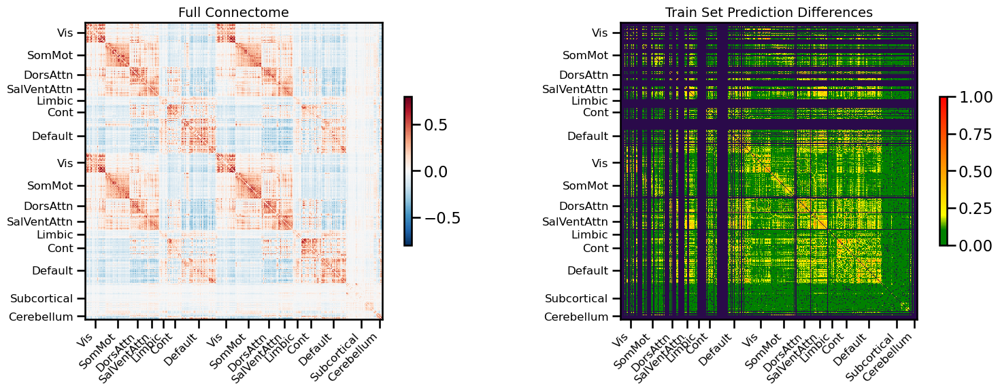

<Figure size 640x480 with 0 Axes>

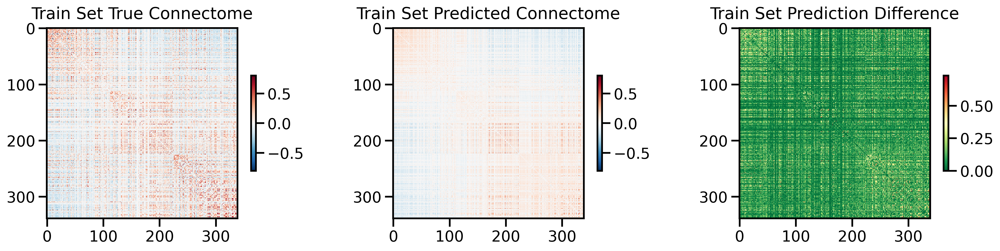

  return iter(self.unbind(0))

  return iter(self.unbind(0))



<Figure size 640x480 with 0 Axes>

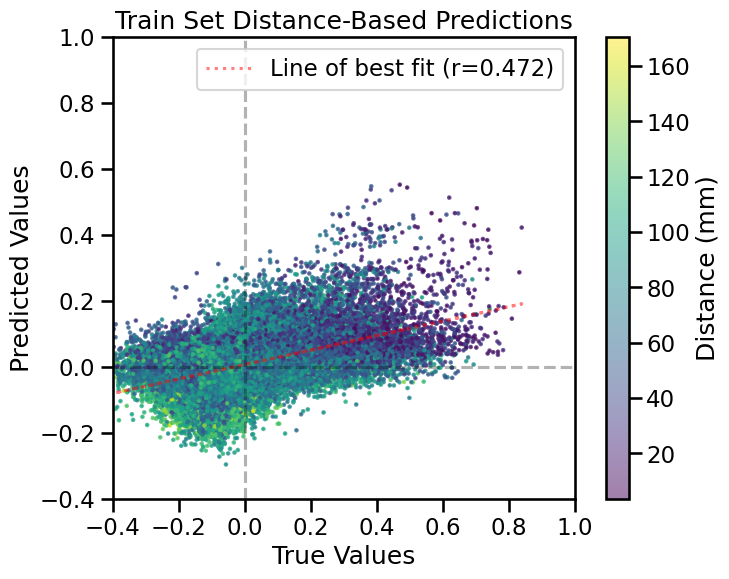

Running test evaluation...

=== TEST EVALUATION ===
Evaluating 116 regions, 13340 connections


<Figure size 640x480 with 0 Axes>

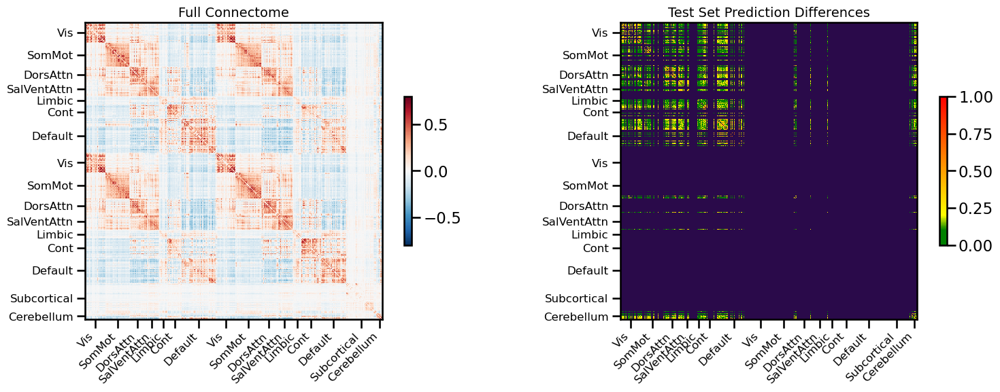

<Figure size 640x480 with 0 Axes>

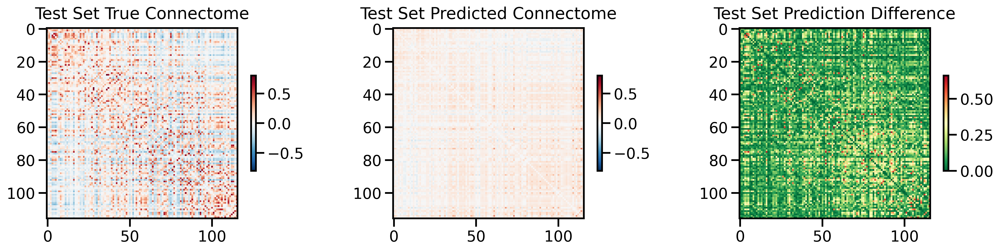

<Figure size 640x480 with 0 Axes>

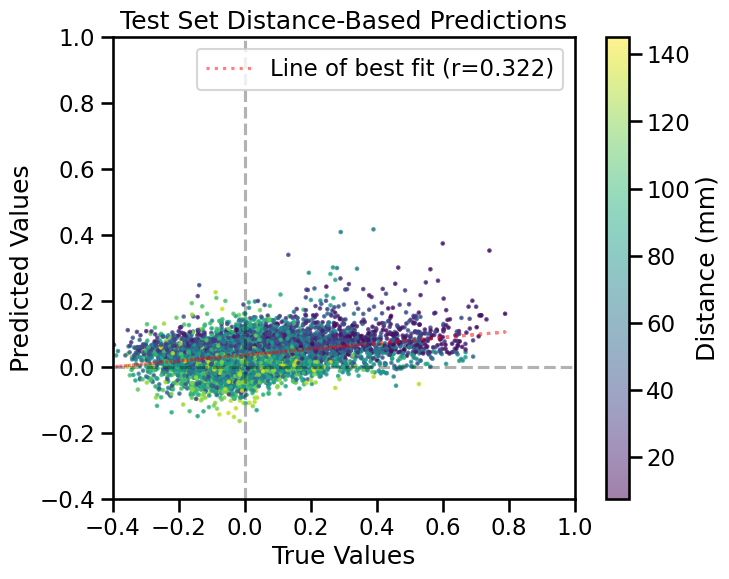

TRAIN METRICS
GLOBAL: mse=0.018015, mae=0.095015, r2=0.2230, pearson_r=0.4724, spearman_r=0.4707, geodesic_distance=33.8346
DISTANCE-BASED: short=0.5077, mid=0.3801, long=0.3115
HEMISPHERIC: left=0.5199, right=0.4504, inter=0.4849
CONNECTION STRENGTH: neg=0.0121, weak=0.4208, pos=0.1559
NETWORK CORRELATIONS:
  NETWORK      INTRA      INTER
  ------------------------------
  Cont          0.2627    0.3155
  Default       0.3444    0.2675
  SalVentAttn    0.2557    0.2662
  Limbic        0.5271    0.3992
  DorsAttn      0.1776    0.3943
  SomMot        0.3849    0.4695
  Vis           0.3413    0.4408
  Subcortical    0.5738    0.3991
  Cerebellum       N/A    0.1347

TEST METRICS
GLOBAL: mse=0.030939, mae=0.132952, r2=0.1001, pearson_r=0.3223, spearman_r=0.2981, geodesic_distance=22.2273
DISTANCE-BASED: short=0.3953, mid=0.1805, long=-0.0936
HEMISPHERIC: left=0.3222, right=0.4406, inter=0.3287
CONNECTION STRENGTH: neg=-0.1021, weak=0.2458, pos=0.1690
NETWORK CORRELATIONS:
  NETWORK     

  from IPython.core.display import HTML, display  # type: ignore



best_val_loss,▁
test_mse_loss,▁
train_mse_loss,▁
best_val_loss,0.02768
test_mse_loss,0.03094
train_mse_loss,0.01801


Final evaluation metrics logged successfully.
CPU Usage: 4.7%
RAM Usage: 4.9%
Available RAM: 1.4T
Total RAM: 1.5T
| ID | GPU | MEM |
------------------
|  0 |  0% |  3% |
Sim complete
Simulation completed in 222.21 seconds (3.70 minutes)


0

<Figure size 640x480 with 0 Axes>

In [11]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              dataset='HCP',
              parcellation='S456',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='refgenome',
              gene_list='0.2',
              cv_type='spatial',
              random_seed=9,
              search_method=('wandb', 'mse', 3),
              track_wandb=True,
              skip_cv=False,
              model_type='pls_bilineardecoder',
              use_gpu=True,
              null_model='none',
              use_folds=[0, 1, 2, 3]
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# Clear CPU memory
gc.collect()

In [15]:
from data.data_load import load_network_labels
labels, network_labels = load_network_labels(parcellation='S456', omit_subcortical=False, dataset='HCP', hemisphere='both')


In [16]:
network_labels

array(['Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'SalVentAttn', 'SalVentAttn', 'S